<a href="https://colab.research.google.com/github/ar851060/ESUN_AI_2021_winter/blob/main/4_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 引入套件

In [ ]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.linear_model import LinearRegression
from mlxtend.frequent_patterns import apriori, association_rules
import plotly.express as px

# 讀入資料(EDA)

In [ ]:
# 用小樣本跑EDA
data = pd.read_csv('/content/drive/Shareddrives/統學期末比賽/Sample/new_sample_w_all.csv')

In [ ]:
data.drop(['Unnamed: 0'], axis = 1, inplace = True)
data.head(10)

,dt,chid,shop_tag,txn_cnt,txn_amt,domestic_offline_cnt,domestic_online_cnt,overseas_offline_cnt,overseas_online_cnt,domestic_offline_amt_pct,domestic_online_amt_pct,overseas_offline_amt_pct,overseas_online_amt_pct,card_1_txn_cnt,card_2_txn_cnt,card_3_txn_cnt,card_4_txn_cnt,card_5_txn_cnt,card_6_txn_cnt,card_7_txn_cnt,card_8_txn_cnt,card_9_txn_cnt,card_10_txn_cnt,card_11_txn_cnt,card_12_txn_cnt,card_13_txn_cnt,card_14_txn_cnt,card_other_txn_cnt,card_1_txn_amt_pct,card_2_txn_amt_pct,card_3_txn_amt_pct,card_4_txn_amt_pct,card_5_txn_amt_pct,card_6_txn_amt_pct,card_7_txn_amt_pct,card_8_txn_amt_pct,card_9_txn_amt_pct,card_10_txn_amt_pct,card_11_txn_amt_pct,card_12_txn_amt_pct,card_13_txn_amt_pct,card_14_txn_amt_pct,card_other_txn_amt_pct,masts,educd,trdtp,naty,poscd,cuorg,slam,gender_code,age,primary_card
0,1,10057100,10,3,13641.139592,0,3,0,0,0.0,1.0,0.0,0.0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,6.0,15.0,1.0,99.0,30.0,609516.579768,0.0,2.0,0
1,1,10464422,2,1,3439.956201,1,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,15.0,1.0,99.0,30.0,147825.129463,0.0,5.0,1
2,1,10357555,2,5,42905.621943,5,0,0,0,1.0,0.0,0.0,0.0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,15.0,1.0,99.0,30.0,158051.303473,0.0,2.0,0
3,1,10216609,37,6,13878.196493,6,0,0,0,1.0,0.0,0.0,0.0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,6.0,15.0,1.0,99.0,30.0,86109.761716,0.0,5.0,1
4,1,10070877,other,2,7232.187387,2,0,0,0,1.0,0.0,0.0,0.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,11.0,1.0,2.0,30.0,97471.116631,1.0,5.0,1
5,1,10070877,48,4,12569.116555,4,0,0,0,1.0,0.0,0.0,0.0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,11.0,1.0,2.0,30.0,97471.116631,1.0,5.0,1
6,1,10143994,19,1,9598.961126,1,0,0,0,1.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,15.0,1.0,99.0,30.0,102382.569589,0.0,5.0,1
7,1,10265119,37,1,14091.519933,1,0,0,0,1.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,15.0,1.0,99.0,30.0,72218.713500,0.0,5.0,1
8,1,10017122,2,2,10655.949155,2,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,2.0,1.0,6.0,30.0,47494.529703,0.0,4.0,1
9,1,10017122,19,1,11149.749171,1,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,2.0,1.0,6.0,30.0,47494.529703,0.0,4.0,1


In [ ]:
# 樣本大小
data.shape

(665202, 53)

In [ ]:
# 共有幾個不同的ID
len(np.unique(data.chid))

10000

In [ ]:
# 只用最靠近的12個月資料
data = data[data['dt'] > 11]
data.shape

(397677, 53)

## 分成要predict的類別跟不要predict的類別

In [ ]:
pred = list(map(str, [2,6,10,12,13,15,18,19,21,22,25,26,36,37,39,48]))

In [ ]:
# 全部的相異類別
np.unique(data['shop_tag'])

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29',
       '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39',
       '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '5',
       '6', '7', '8', '9', 'other'], dtype=object)

In [ ]:
data_s_pred = data.loc[data['shop_tag'].isin(pred)]
data_s_notpred = data.loc[~data['shop_tag'].isin(pred)]

In [ ]:
data.describe()

,dt,chid,txn_cnt,txn_amt,domestic_offline_cnt,domestic_online_cnt,overseas_offline_cnt,overseas_online_cnt,domestic_offline_amt_pct,domestic_online_amt_pct,overseas_offline_amt_pct,overseas_online_amt_pct,card_1_txn_cnt,card_2_txn_cnt,card_3_txn_cnt,card_4_txn_cnt,card_5_txn_cnt,card_6_txn_cnt,card_7_txn_cnt,card_8_txn_cnt,card_9_txn_cnt,card_10_txn_cnt,card_11_txn_cnt,card_12_txn_cnt,card_13_txn_cnt,card_14_txn_cnt,card_other_txn_cnt,card_1_txn_amt_pct,card_2_txn_amt_pct,card_3_txn_amt_pct,card_4_txn_amt_pct,card_5_txn_amt_pct,card_6_txn_amt_pct,card_7_txn_amt_pct,card_8_txn_amt_pct,card_9_txn_amt_pct,card_10_txn_amt_pct,card_11_txn_amt_pct,card_12_txn_amt_pct,card_13_txn_amt_pct,card_14_txn_amt_pct,card_other_txn_amt_pct,masts,educd,trdtp,naty,poscd,cuorg,slam,gender_code,age,primary_card
count,665202.000000,6.652020e+05,665202.000000,6.652020e+05,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.00000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,665202.000000,6.652020e+05,665202.000000,665202.000000,665202.000000
mean,13.459966,1.024935e+07,2.543387,9.976601e+108,1.390190,0.932189,0.017662,0.203346,0.644308,0.289092,0.008250,0.058352,0.633800,0.369216,0.072852,0.401120,0.067473,0.429889,0.061895,0.086052,0.029731,0.076159,0.034611,0.022939,0.012778,0.013288,0.231585,0.229414,0.173792,0.031820,0.174093,0.030411,0.116110,0.020189,0.037670,0.013966,0.036165,0.012572,0.011676,0.00558,0.005392,0.101153,1.531849,3.627685,10.204858,1.001715,33.022052,29.487314,7.537650e+113,0.446821,3.643149,0.918032
std,6.749585,1.421137e+05,4.094042,8.136907e+111,2.857443,2.855102,0.255179,1.610945,0.467744,0.440465,0.087693,0.227657,2.116653,1.304764,0.718100,1.763685,1.065849,2.164647,0.757732,0.722797,0.483822,0.612240,0.486226,0.323649,0.281755,0.288748,1.205508,0.417112,0.377928,0.174168,0.377259,0.171077,0.316833,0.139265,0.188908,0.116699,0.185446,0.110630,0.106982,0.07392,0.072673,0.299294,0.500023,1.222723,4.822763,0.041380,44.728591,3.271124,3.073844e+116,0.497164,1.158084,0.274316
min,1.000000,1.000005e+07,-22.000000,2.237085e+01,-3.000000,-12.000000,-1.000000,-22.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,-3.000000,-2.000000,-2.000000,-1.000000,-24.000000,-3.000000,-3.000000,-3.000000,-1.000000,0.000000,-3.000000,0.000000,-1.000000,-12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.139239e+04,0.000000,1.000000,0.000000
25%,8.000000,1.012778e+07,1.000000,5.773036e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,3.000000,5.000000,1.000000,2.000000,30.000000,6.092366e+04,0.000000,3.000000,1.000000
50%,14.000000,1.024977e+07,1.000000,8.296454e+03,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,2.000000,3.000000,11.000000,1.000000,3.000000,30.000000,7.929124e+04,0.000000,3.000000,1.000000
75%,19.000000,1.

## sales channel
* domestic/overseas
* offline/online
* cnt/amt_pct

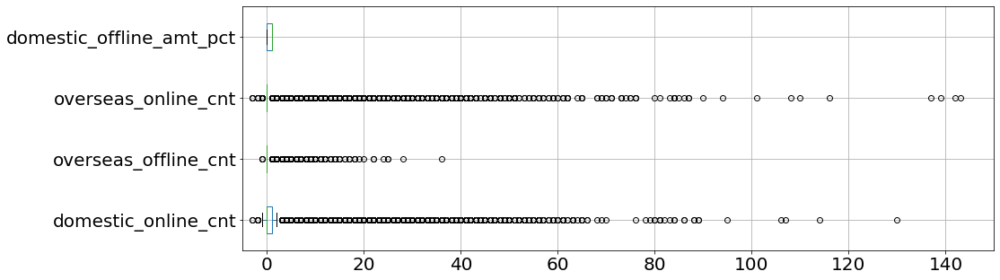

In [ ]:
data.iloc[:,6:10].boxplot(figsize = (15,5), vert=False)
plt.xlim([-5,150])
plt.tick_params(labelsize=20)
plt.show()

In [ ]:
data.iloc[:,6:10].apply(sum, axis = 0)

domestic_online_cnt         620094.00
overseas_offline_cnt         11749.00
overseas_online_cnt         135266.00
domestic_offline_amt_pct    428595.19
dtype: float64

*   次數：海外實體通路平均最少、最大值也最小




### 通路cnt對shop_tag

In [ ]:
data_lines = pd.DataFrame(data=data_s_pred[data_s_pred['shop_tag']==2].iloc[:,range(5,9)].sum(), columns=[str(2)])
for i in pred:
  line = data_s_pred[data_s_pred['shop_tag']==i].iloc[:,range(5,9)].sum()
  data_lines[str(i)] = line
  del line
data_lines

,2,6,10,12,13,15,18,19,21,22,25,26,36,37,39,48
domestic_offline_cnt,92714,14206,2920,12107,2158,91782,10600,21410,12833,13651,19841,11391,90618,179148,13450,51175
domestic_online_cnt,6485,2090,65449,19735,38981,43353,5600,5876,2190,1717,2823,1936,197975,58712,1181,27355
overseas_offline_cnt,682,199,1308,126,3,1546,298,658,55,0,0,403,0,1042,700,286
overseas_online_cnt,108,83,68601,345,22113,5536,324,652,9,0,0,16,0,8,402,14392


* domestic>>overseas
* overseas_offline最少
* 10 12 13 的online都比offline高 (幾乎只有online)
* 2 的offline比online高 (幾乎只有offline)
* 36 的domestic_online最高，其次是37的domestic_offline

### 通路amt_pct對shop_tag

In [ ]:
data_lines_amt = pd.DataFrame(data=data_s_pred[data_s_pred['shop_tag']==2].iloc[:,range(9,13)].sum(), columns=[str(2)])
for i in pred[1:]:
  line = data_s_pred[data_s_pred['shop_tag']==i].iloc[:,range(9,13)].sum()
  data_lines_amt[str(i)] = line
  del line
data_lines_amt

* 看占比較沒意義

### 兩個一起看

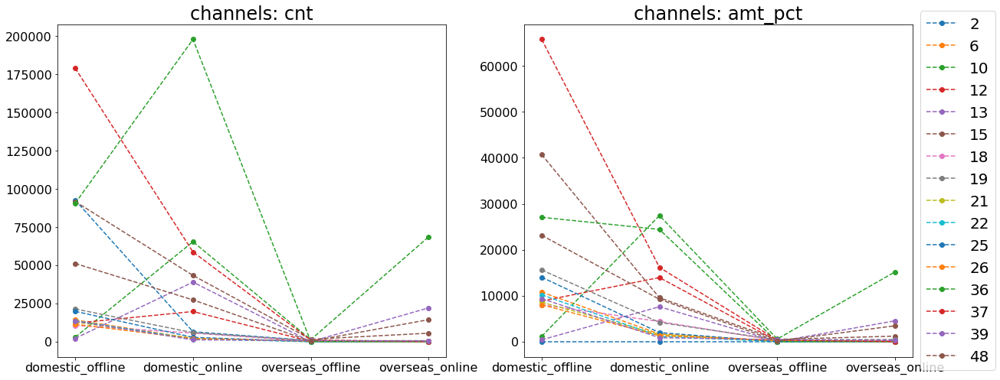

In [ ]:
data_lines.index=['domestic_offline','domestic_online','overseas_offline','overseas_online']
data_lines_amt.index=['domestic_offline','domestic_online','overseas_offline','overseas_online']
fig, axs = plt.subplots(1, 2, figsize=(20,8))
for i in pred:
  axs[0].plot(data_lines[i],label=i, linestyle='--', marker='o')
  axs[1].plot(data_lines_amt[i],label=i, linestyle='--', marker='o')
axs[0].set_title('channels: cnt', size=24)
axs[1].set_title('channels: amt_pct', size=24)
box = axs[1].get_position()
axs[1].set_position([box.x0, box.y0, box.width * 1, box.height])
axs[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), prop={'size': 20})
axs[0].tick_params(labelsize=16)
axs[1].tick_params(labelsize=16)
plt.show()

## txn_amt & shop_tag

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


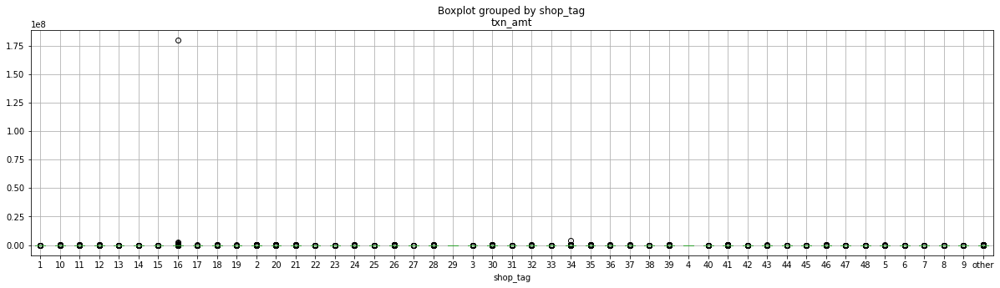

In [ ]:
data[data['txn_amt']<10**10].boxplot(column=['txn_amt'], by='shop_tag', figsize = (20,5))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


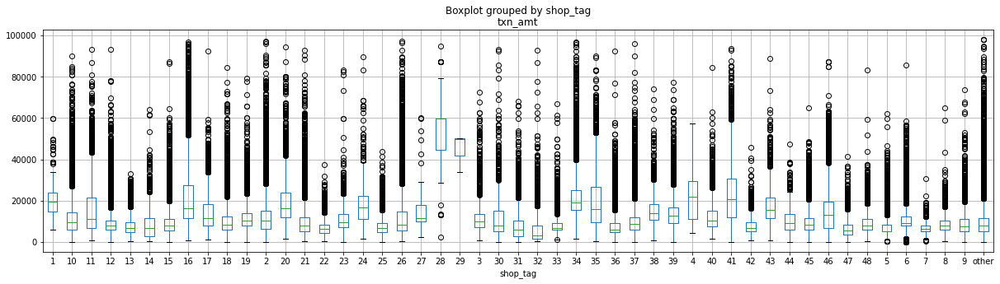

In [ ]:
data[data['txn_amt']<10**5].boxplot(column=['txn_amt'], by='shop_tag', figsize = (20,5))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



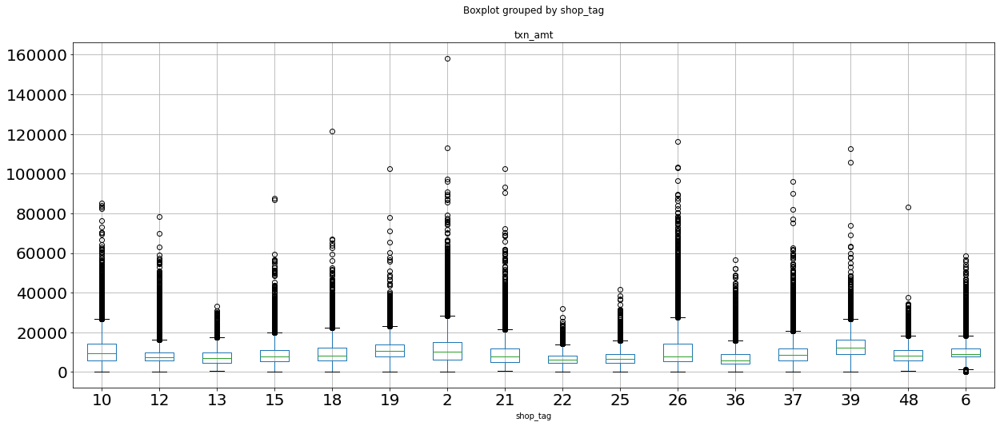

In [ ]:
data_s_pred.boxplot(column=['txn_amt'], by='shop_tag', figsize = (20,8))
plt.tick_params(labelsize=20)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



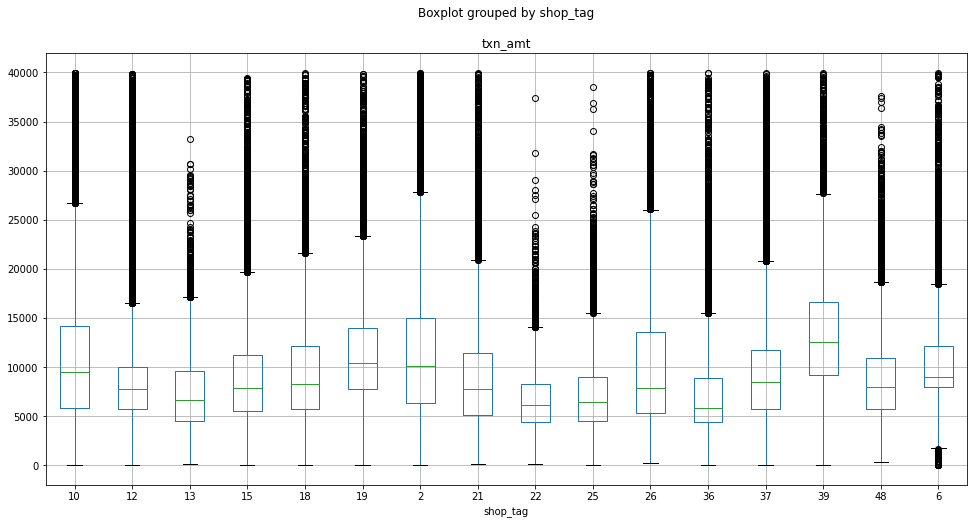

In [ ]:
data_s_pred[data_s_pred['txn_amt']<40000].boxplot(column=['txn_amt'], by='shop_tag', figsize = (16,8))

* 不同類別的消費金額的確是有差別的。

## txn_cnt & shop_tag

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


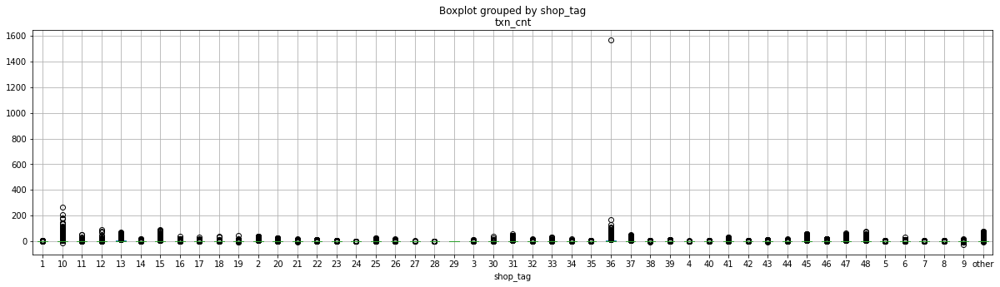

In [ ]:
data.boxplot(column=['txn_cnt'], by='shop_tag', figsize = (20,5))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


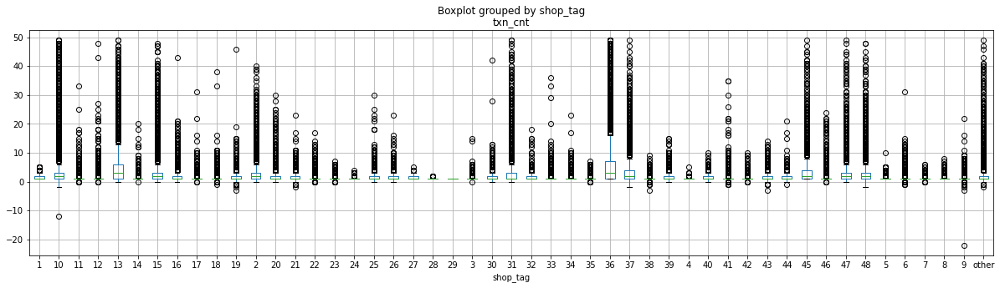

In [ ]:
data[data['txn_cnt']<50].boxplot(column=['txn_cnt'], by='shop_tag', figsize = (20,5))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


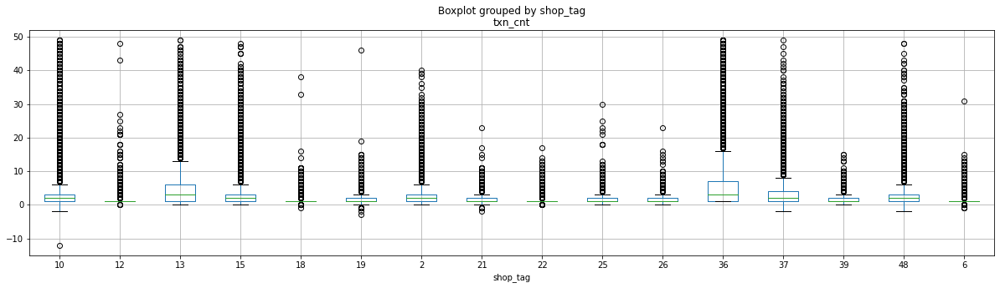

In [ ]:
data_s_pred[data_s_pred['txn_cnt']<50].boxplot(column=['txn_cnt'], by='shop_tag', figsize = (20,5))

* 13、36的次數較多，6、12、18、19、22較少。

## shop_tag & slam

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



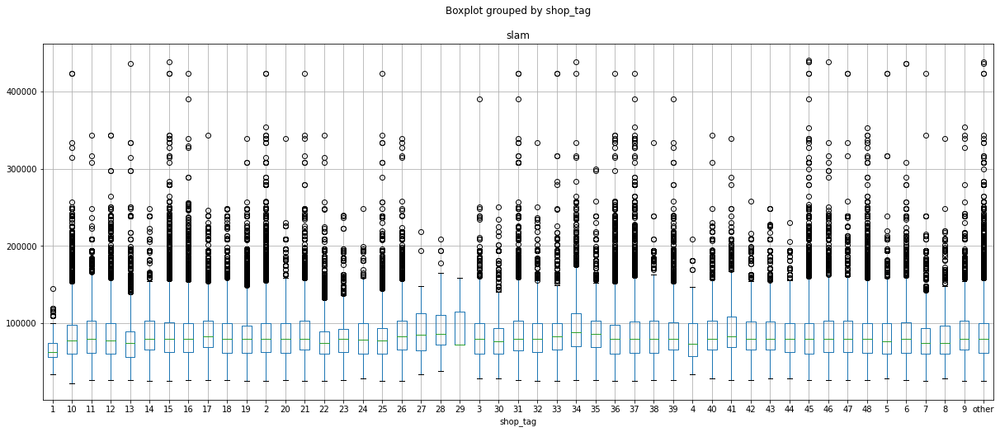

In [ ]:
data[data['slam']<5*10**5].boxplot(column=['slam'], by='shop_tag', figsize = (20,8))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



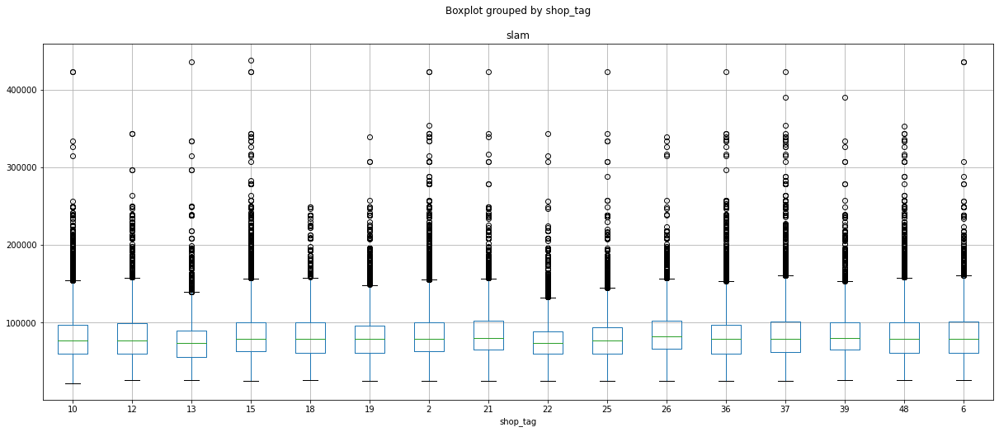

In [ ]:
data_s_pred[data_s_pred['slam']<5*10**5].boxplot(column=['slam'], by='shop_tag', figsize = (20,8))

* 不同的類別在對應的信用額度之間的關聯性不強。

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



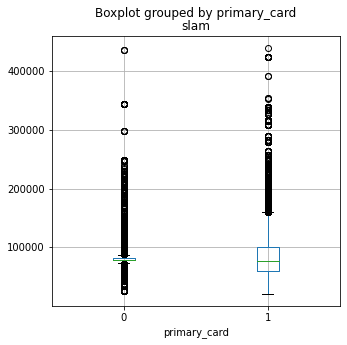

In [ ]:
data_s_pred[data_s_pred['slam']<5*10**5].boxplot(column=['slam'], by='primary_card', figsize = (5,5))

*   slam是代表這些卡中的主要卡片的額度，正卡註記為0代表可能有一些卡不是正卡，但不能確定哪張是哪張不是



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



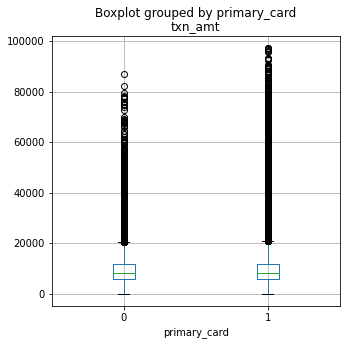

In [ ]:
data_s_pred[data_s_pred['txn_amt']<10**5].boxplot(column=['txn_amt'], by='primary_card', figsize = (5,5))

In [ ]:
[sum(data_s_pred.primary_card == 0), sum(data_s_pred.primary_card == 1)]

[37454, 407927]

In [ ]:
# 看有沒有哪一張卡和正卡註記與否較有關連
pct = []
for i in pred:
  n = sum(data_s_pred.shop_tag == i)
  pct = pct + [(sum(data_s_pred[data_s_pred.shop_tag == i].primary_card == 0))/n, (sum(data_s_pred[data_s_pred.shop_tag == i].primary_card == 1))/n]


In [ ]:
PCT = np.array(pct).reshape(16,2)
PCT = pd.DataFrame(PCT)

In [ ]:
# PCT = PCT.set_axis(pred, axis=0)
PCT = PCT.transpose()

In [ ]:
PCT

,2,6,10,12,13,15,18,19,21,22,25,26,36,37,39,48
0,0.093412,0.103762,0.07519,0.077214,0.097812,0.091585,0.088681,0.0885,0.09049,0.091069,0.083641,0.089583,0.080342,0.071282,0.068893,0.096596
1,0.906588,0.896238,0.92481,0.922786,0.902188,0.908415,0.911319,0.9115,0.90951,0.908931,0.916359,0.910417,0.919658,0.928718,0.931107,0.903404


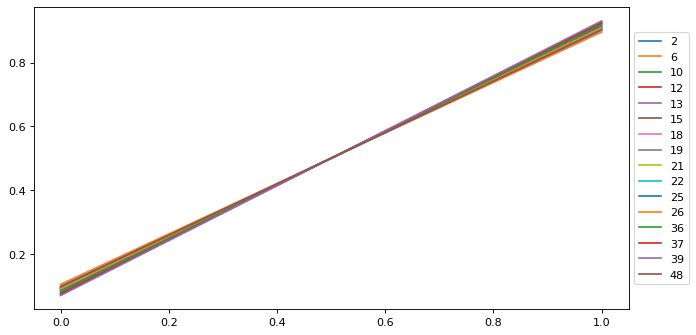

In [ ]:
fig = plt.figure(figsize=(12, 5), dpi=80)
ax = plt.subplot(111)

for i in pred:
  ax.plot(PCT[i],label=i)

# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

*   看起來每張卡的情形都差不多

## txn_amt & txn_cnt

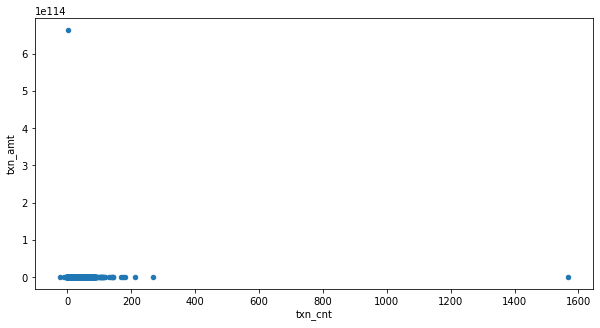

In [ ]:
data.plot.scatter(x='txn_cnt', y='txn_amt', figsize = (10,5))

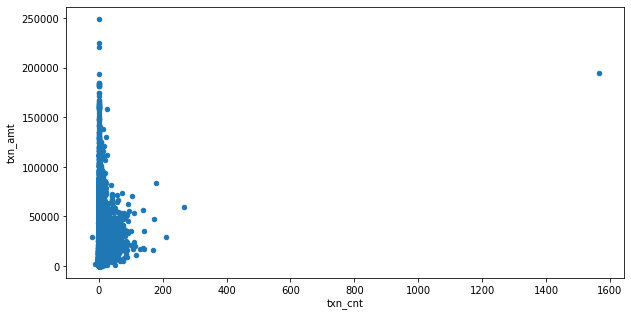

In [ ]:
data[data['txn_amt']<5*10**5].plot.scatter(x='txn_cnt', y='txn_amt', figsize = (10,5))

In [ ]:
np.corrcoef(data['txn_cnt'], data['txn_amt'])

array([[ 1.00000000e+00, -4.62217433e-04],
       [-4.62217433e-04,  1.00000000e+00]])

In [ ]:
np.corrcoef(data[data['txn_amt']<50000]['txn_cnt'], data[data['txn_amt']<50000]['txn_amt'])

array([[1.        , 0.22048443],
       [0.22048443, 1.        ]])

In [ ]:
np.corrcoef(data[data['txn_amt']>50000]['txn_cnt'], data[data['txn_amt']>50000]['txn_amt'])

array([[ 1.      , -0.002336],
       [-0.002336,  1.      ]])

* 在金額較小的情況下，消費次數和消費金額是略呈正相關(0.22)；但隨著金額增加到50000以上，反而沒有正項關係甚至略呈負向(-0.003)。

In [ ]:
px.scatter(data_s_pred, x='txn_cnt', y='txn_amt', color='shop_tag')

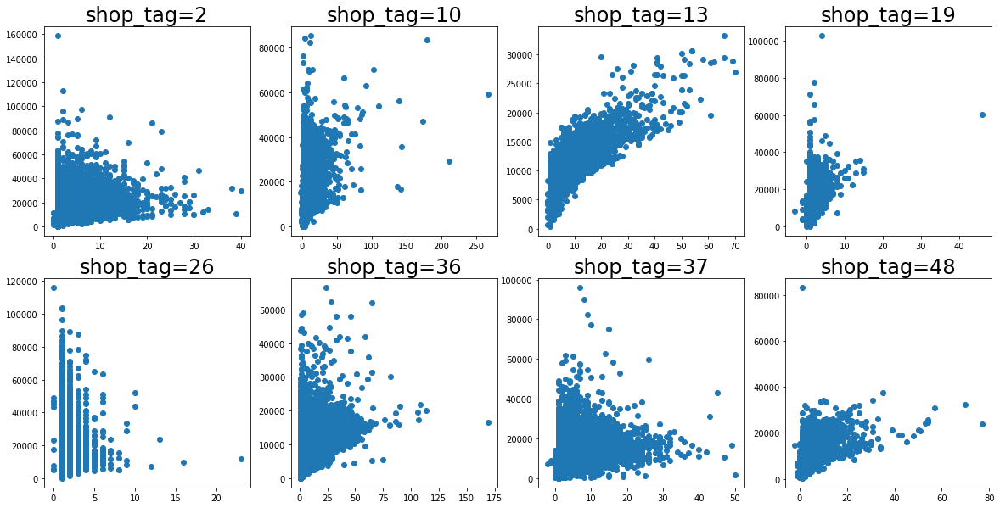

In [ ]:
fig, axs = plt.subplots(2, 4,figsize=(20,10))
axs[0, 0].scatter(data_s_pred[data_s_pred['shop_tag']=='2']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='2']['txn_amt'])
axs[0, 0].set_title('shop_tag=2', size=24)
axs[0, 1].scatter(data_s_pred[data_s_pred['shop_tag']=='10']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='10']['txn_amt'])
axs[0, 1].set_title('shop_tag=10', size=24)
axs[0, 2].scatter(data_s_pred[data_s_pred['shop_tag']=='13']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='13']['txn_amt'])
axs[0, 2].set_title('shop_tag=13', size=24)
axs[0, 3].scatter(data_s_pred[data_s_pred['shop_tag']=='19']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='19']['txn_amt'])
axs[0, 3].set_title('shop_tag=19', size=24)

axs[1, 0].scatter(data_s_pred[data_s_pred['shop_tag']=='26']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='26']['txn_amt'])
axs[1, 0].set_title('shop_tag=26', size=24)
axs[1, 1].scatter(data_s_pred[data_s_pred['shop_tag']=='36']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='36']['txn_amt'])
axs[1, 1].set_title('shop_tag=36', size=24)
axs[1, 2].scatter(data_s_pred[data_s_pred['shop_tag']=='37']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='37']['txn_amt'])
axs[1, 2].set_title('shop_tag=37', size=24)
axs[1, 3].scatter(data_s_pred[data_s_pred['shop_tag']=='48']['txn_cnt'], data_s_pred[data_s_pred['shop_tag']=='48']['txn_amt'])
axs[1, 3].set_title('shop_tag=48', size=24)

plt.show()

* 以shop_tag區分的話，能看出不同顏色看起來都是有正相關，每個shop_tag下的斜率不同。

In [ ]:
# 看一下每個類別下兩者的相關性和簡單回歸的係數
corr = list()
for i in pred:
  c = np.corrcoef(data_s_pred[data_s_pred['shop_tag']==i]['txn_cnt'], data_s_pred[data_s_pred['shop_tag']==i]['txn_amt'])[0,1]
  corr.append(c)


In [ ]:
reg = list()
for i in pred:
  model = LinearRegression().fit(X=np.array(data_s_pred[data_s_pred['shop_tag']==i]['txn_cnt']).reshape(-1,1), y=(data_s_pred[data_s_pred['shop_tag']==i]['txn_amt']))
  r = model.coef_[0]
  reg.append(r)

In [ ]:
relation_tags = {'tags':pred, 'corr':list(np.around(np.array(corr),2)), 'regression':list(np.around(np.array(reg),2))}
relation_tags = pd.DataFrame(relation_tags)
relation_tags.transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
tags,2.00,6.00,10.00,12.00,13.00,15.00,18.00,19.00,21.00,22.00,25.00,26.00,36.00,37.00,39.00,48.00
corr,0.42,0.45,0.44,0.24,0.83,0.38,0.17,0.46,0.28,0.37,0.43,0.17,0.48,0.47,0.33,0.58
regression,1224.58,3178.10,653.97,1549.71,477.77,549.35,1083.69,2995.98,1950.50,878.92,1535.48,1860.08,255.25,748.28,2434.62,776.72


*   有些類別下相關性較高，斜率則各有不同

## shop_tag & card_x_txn_cnt

In [ ]:
data_cards = pd.DataFrame(data=data_s_pred[data_s_pred['shop_tag']==2].iloc[:,range(13,28)].sum(), columns=[str(2)])
for i in pred:
  card = data_s_pred[data_s_pred['shop_tag']==i].iloc[:,range(13,28)].sum()
  data_cards[str(i)] = card
  del card
data_cards

,2,6,10,12,13,15,18,19,21,22,25,26,36,37,39,48
card_1_txn_cnt,14929,2414,16329,4262,10449,26322,2656,4124,2863,2310,3760,2217,52167,24336,1838,8433
card_2_txn_cnt,8110,1971,9561,2394,3953,10121,1390,2741,1445,809,1976,1600,9240,17546,3208,11547
card_3_txn_cnt,2321,683,2149,416,1871,3742,292,592,291,155,277,331,1115,2380,431,1696
card_4_txn_cnt,3058,1063,8729,2454,3900,7292,1091,1510,1145,868,1430,810,11897,59430,488,4582
card_5_txn_cnt,807,289,3151,536,1593,1211,245,383,144,133,273,201,2496,1321,151,1624
card_6_txn_cnt,5307,836,21399,3159,16667,20901,1637,2393,1045,878,2146,494,83237,9587,588,9542
card_7_txn_cnt,2283,281,3293,488,2097,4471,322,479,403,135,364,257,3358,2439,466,1870
card_8_txn_cnt,1086,215,2077,744,1645,2717,293,342,236,245,389,191,3156,2934,142,1792
card_9_txn_cnt,521,114,1621,239,789,533,189,266,93,122,201,137,302,1303,65,392
card_10_txn_cnt,956,217,2876,856,1209,2031,268,320,177,231,328,235,2998,3203,138,2269


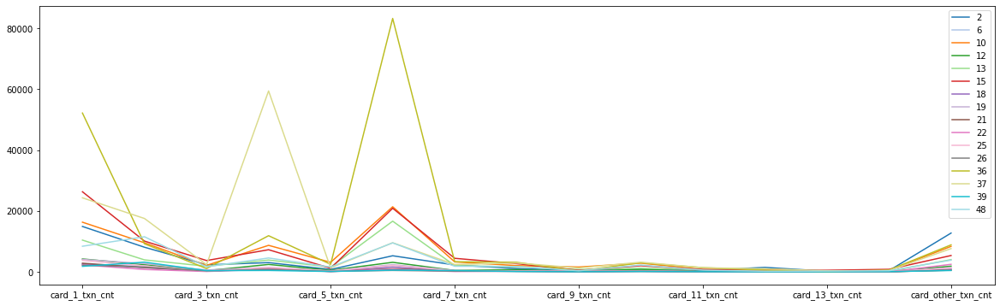

In [ ]:
data_cards.plot(figsize = (20,6),cmap = 'tab20')

* 卡片一、二、四、六、others是次數比較多的
* 36在卡片6最多(也是全部裡面最多的)
* 卡片一是該類別最高的:2 6 12 15 18 19 21 25 26 
* 36 37 最多

## shop_tag & card_x_txn_amt_pct

In [ ]:
data_cards_amt = pd.DataFrame(data=data_s_pred[data_s_pred['shop_tag']==2].iloc[:,range(28,43)].sum(), columns=[str(2)])
for i in pred:
  card = data_s_pred[data_s_pred['shop_tag']==i].iloc[:,range(28,43)].sum()
  data_cards_amt[str(i)] = card
  del card
data_cards_amt

,2,6,10,12,13,15,18,19,21,22,25,26,36,37,39,48
card_1_txn_amt_pct,5536.72,1757.50,5673.55,2987.80,2238.27,7972.16,1940.02,2789.50,1800.43,1695.88,2494.95,1479.91,7896.29,7586.72,1279.54,3210.50
card_2_txn_amt_pct,3479.71,1521.48,3293.10,1739.54,846.39,4617.28,1059.70,2037.50,962.09,644.17,1397.27,1089.08,2527.13,5716.87,2178.31,4141.10
card_3_txn_amt_pct,844.99,415.17,749.79,317.17,246.20,1069.38,233.91,396.42,219.95,121.14,217.07,242.44,248.01,805.87,285.45,504.37
card_4_txn_amt_pct,1670.43,882.82,2743.71,1899.15,877.20,4061.76,837.13,1197.86,788.67,709.70,1087.71,615.94,4013.50,19745.98,364.51,2523.37
card_5_txn_amt_pct,434.53,226.00,816.58,468.06,334.86,620.19,189.62,288.95,107.00,109.64,215.20,126.00,570.97,597.07,105.88,561.73
card_6_txn_amt_pct,2394.46,664.49,6472.95,2041.41,3042.91,5130.01,1203.49,1724.86,755.02,695.43,1464.59,355.77,9281.62,3453.38,449.91,3099.90
card_7_txn_amt_pct,684.85,199.56,584.83,318.56,324.04,1004.90,237.43,302.40,225.45,109.16,257.90,184.11,456.08,740.56,258.03,536.50
card_8_txn_amt_pct,495.08,171.43,728.62,532.19,274.81,822.61,239.59,268.99,142.49,178.63,213.23,151.71,938.34,1021.41,113.99,721.82
card_9_txn_amt_pct,248.24,94.00,445.44,204.00,77.95,283.03,152.43,196.59,74.85,99.35,143.01,90.16,80.23,458.36,52.42,88.72
card_10_txn_amt_pct,501.89,186.21,884.76,583.07,260.17,838.66,202.71,262.31,138.39,189.00,244.82,170.93,1121.72,1142.97,99.63,1000.91


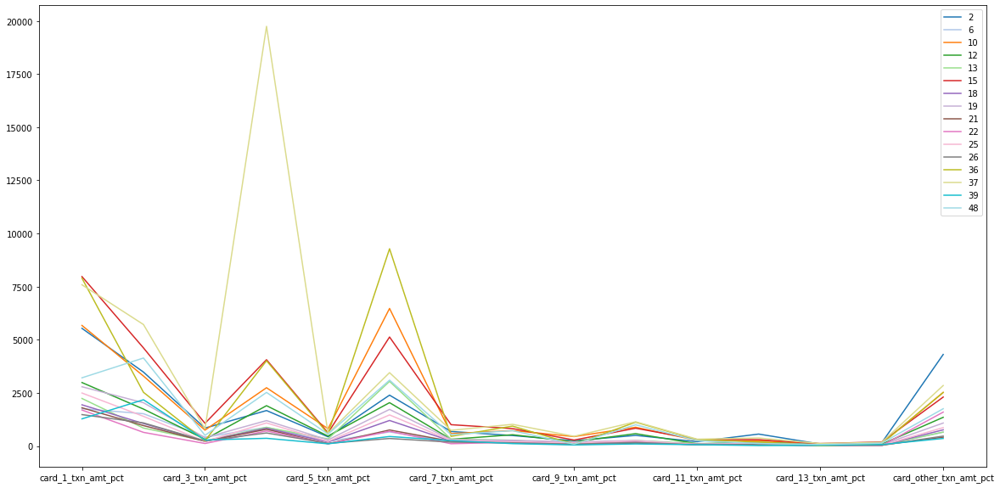

In [ ]:
data_cards_amt.plot(figsize = (20,10),cmap = 'tab20')

* 大致上跟cnt差不多，但金額占比加總最高的是37的卡片4
* 一樣是卡片一、二、四、六、其他 總金額較高

* 可以把少的那些卡都加起來

### 兩個一起看

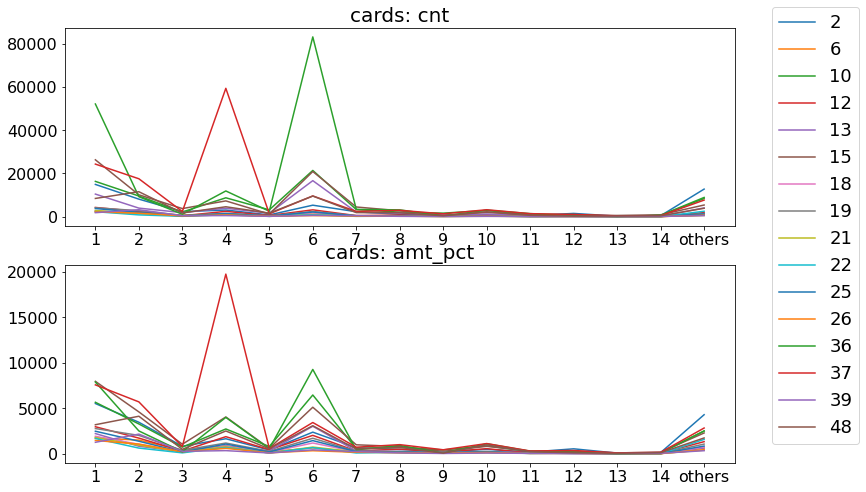

In [ ]:
data_cards.index = list(map(str, [x for x in range(1,15)])) + ['others']
data_cards_amt.index = list(map(str, [x for x in range(1,15)])) + ['others']
fig, axs = plt.subplots(2, 1, figsize=(12,8))
for i in pred:
  axs[0].plot(data_cards[i],label=i)
  axs[1].plot(data_cards_amt[i],label=i)
axs[0].set_title('cards: cnt', size=20)
axs[1].set_title('cards: amt_pct', size=20)
box = axs[1].get_position()
axs[1].set_position([box.x0, box.y0, box.width * 1, box.height])
axs[0].legend(loc='center right', bbox_to_anchor=(1.2, 0), prop={'size': 18})
axs[0].tick_params(labelsize=16)
axs[1].tick_params(labelsize=16)
plt.show()

## 其他

### masts

In [ ]:
np.unique(data['masts'])

array([1., 2., 3.])

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


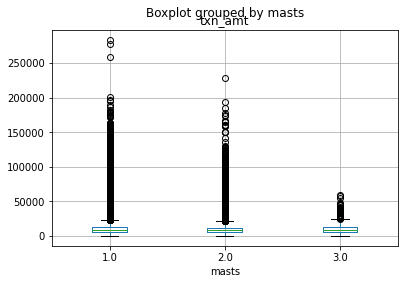

In [ ]:
data.boxplot('txn_amt', by='masts')

* 3可能是離婚，消費金額較低

### age

In [ ]:
np.unique(data['age'])

array([1., 2., 3., 4., 5., 6., 7., 8., 9.])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8997e92b50>,
      dtype=object)

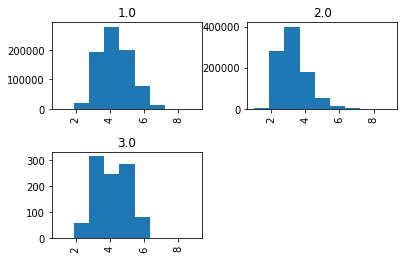

In [ ]:
data.iloc[:,52].hist(by=data.iloc[:,44], bins=9,range=[1,9])

* 2較為右偏

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


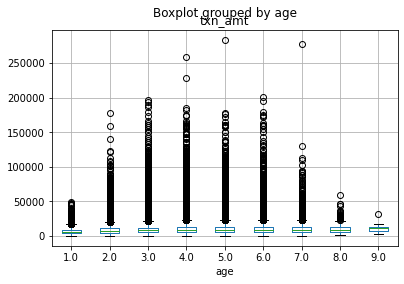

In [ ]:
data.boxplot('txn_amt', by='age')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


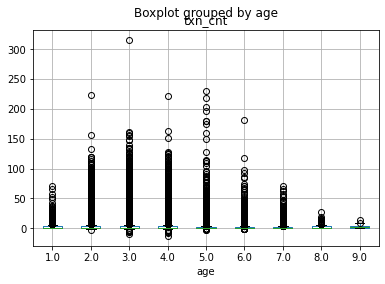

In [ ]:
data.boxplot('txn_cnt', by='age')

*   年紀應該是有照順序，但不確定是大到小or小到大。

### trdtp

In [ ]:
np.unique(data['trdtp'])

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29.])

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 29 Text major ticklabel objects>)

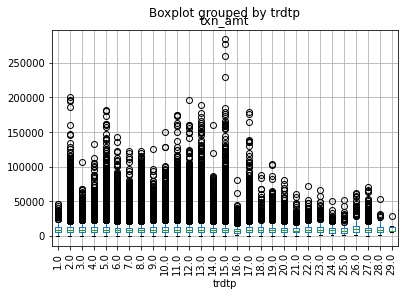

In [ ]:
data.boxplot('txn_amt', by='trdtp')
plt.xticks(rotation = 90)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 29 Text major ticklabel objects>)

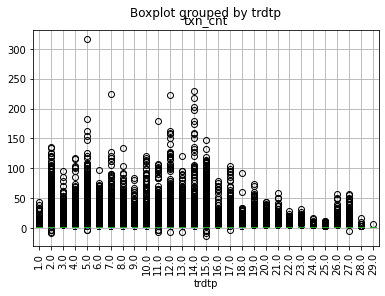

In [ ]:
data.boxplot('txn_cnt', by='trdtp')
plt.xticks(rotation = 90)

### naty

In [ ]:
np.unique(data['naty'])

array([1., 2.])

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


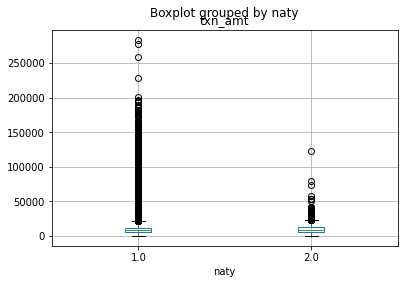

In [ ]:
data.boxplot('txn_amt', by='naty')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


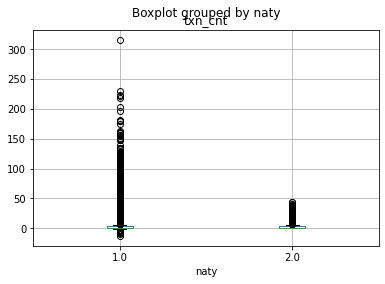

In [ ]:
data.boxplot('txn_cnt', by='naty')

*   大部分是1，應該是本國人

### educd

In [ ]:
np.unique(data['educd'])

array([1., 2., 3., 4., 5., 6.])

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


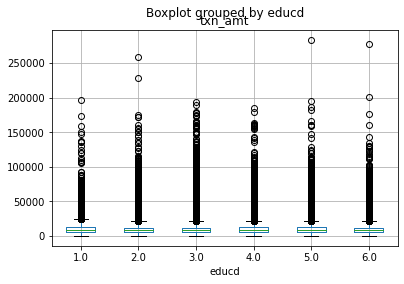

In [ ]:
data[data['txn_amt']<10**5].boxplot('txn_amt', by='educd')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


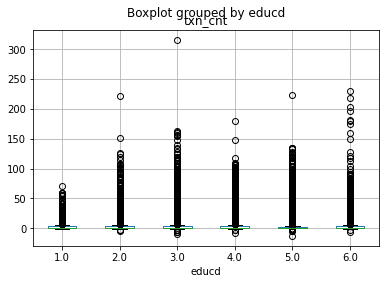

In [ ]:
data[data['txn_cnt']<80].boxplot('txn_cnt', by='educd')

### poscd

In [ ]:
data["txn_amt"] = np.log(data["txn_amt"])

In [ ]:
poscd = np.unique(data['poscd'])
count_poscd = []
for i in poscd:
 count_poscd = count_poscd + [sum(data['poscd'] == i)]

Text(0.5, 1.0, 'count of poscd')

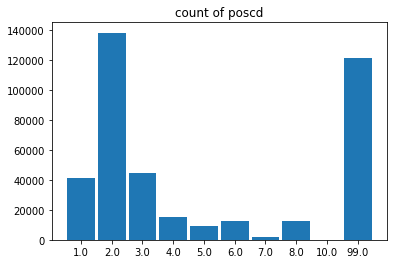

In [ ]:
fig, ax = plt.subplots()
ax.bar(list(map(str,poscd)), count_poscd,  align='center', width = 0.9)
ax.set_title('count of poscd', size=12)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



(-1000.0, 35000.0)

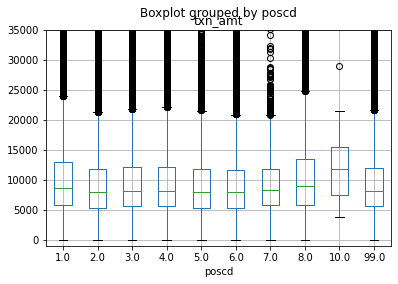

In [ ]:
data.boxplot('txn_amt',by='poscd', figsize = (6,4))
plt.ylim((-1000,35000))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



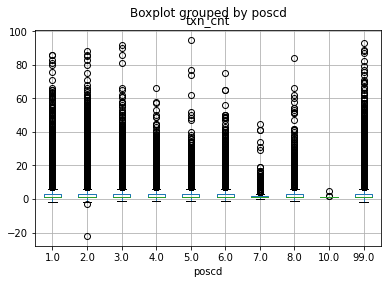

In [ ]:
data[data['txn_cnt']<100].boxplot('txn_cnt',by='poscd')

### cuorg

In [ ]:
np.unique(data['cuorg'])

array([ 2.,  3.,  4.,  6.,  7.,  8., 11., 12., 13., 14., 15., 16., 17.,
       18., 19., 20., 21., 23., 24., 25., 26., 27., 28., 29., 30., 31.,
       32., 35.])

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23]), <a list of 23 Text major ticklabel objects>)

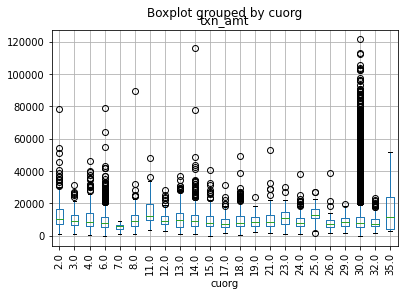

In [ ]:
data_s_pred[data_s_pred['txn_amt']<150000].boxplot('txn_amt',by='cuorg')
plt.xticks(rotation = 90)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23]), <a list of 23 Text major ticklabel objects>)

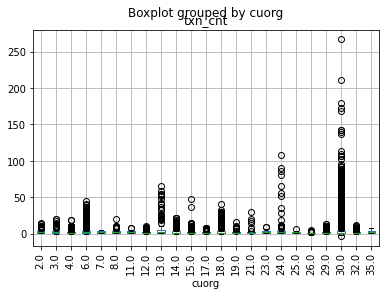

In [ ]:
data.boxplot('txn_cnt',by='cuorg')
plt.xticks(rotation = 90)

### gender_code

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


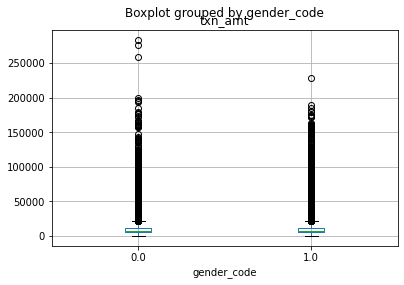

In [ ]:
data[data['txn_amt']<10**5].boxplot('txn_amt',by='gender_code')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


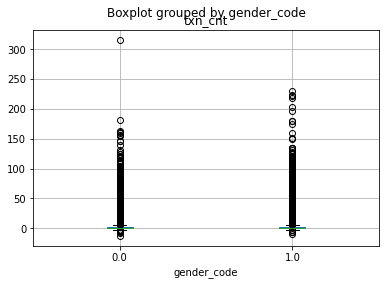

In [ ]:
data[data['txn_cnt']<100].boxplot('txn_cnt',by='gender_code')

Text(0.5, 0, '')

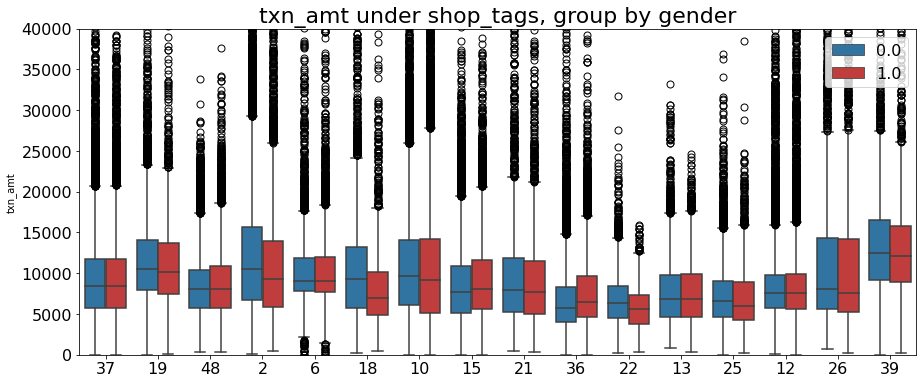

In [ ]:
flierprops = dict(marker='o', markerfacecolor='None', markersize=7,  markeredgecolor='black')
my_pal = {0: '#1f77b4', 1: "#d62728"}
plt.figure(figsize=(15,6))
ax = sns.boxplot(x="shop_tag", y="txn_amt", hue="gender_code", data=data_s_pred[(data_s_pred['txn_amt']<10**6)], palette = my_pal,flierprops=flierprops)
ax.tick_params(labelsize=16)
ax.set_title('txn_amt under shop_tags, group by gender', size = 22)
plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='16') # for legend title
plt.ylim((0,40000))
plt.legend(loc='upper right', prop={'size': 16})
plt.xlabel('')

* 有些tag會因性別不同有差別

### slam

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



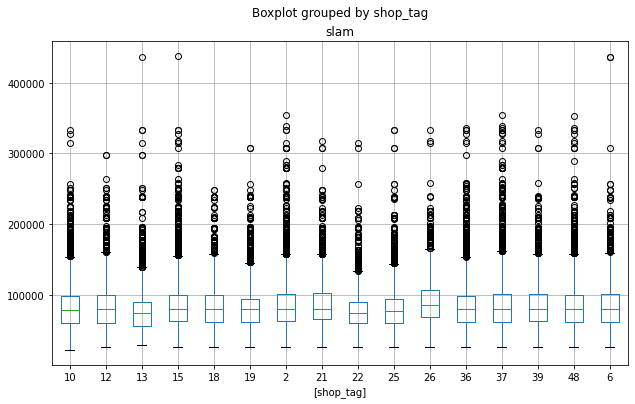

In [ ]:
data_s_pred[(data_s_pred['slam']<5*10**5)].boxplot(column = ['slam'], by = ['shop_tag'], figsize = (10,6))


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



Text(0.5, 0.98, '')

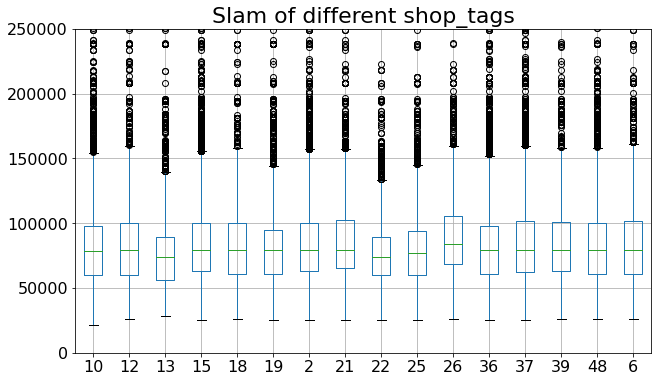

In [ ]:
data_s_pred[(data_s_pred['slam']<5*10**5)].boxplot(column = ['slam'], by = ['shop_tag'], figsize = (10,6))
title_boxplot = 'Slam of different shop_tags'
plt.title(title_boxplot, size=22)
plt.tick_params(labelsize=16)
plt.xlabel('')
plt.ylim((-100,250000))
plt.suptitle('')

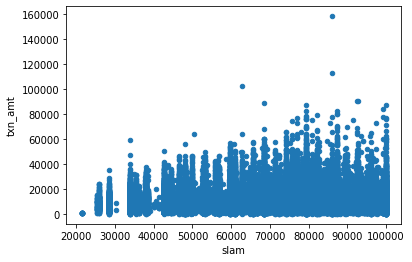

In [ ]:
data_s_pred[(data_s_pred['slam']<10**5)].plot.scatter(x = 'slam', y = 'txn_amt')

In [ ]:
px.scatter(data_s_pred[(data_s_pred['slam']<10**5)], x='slam', y='txn_amt', color='shop_tag')

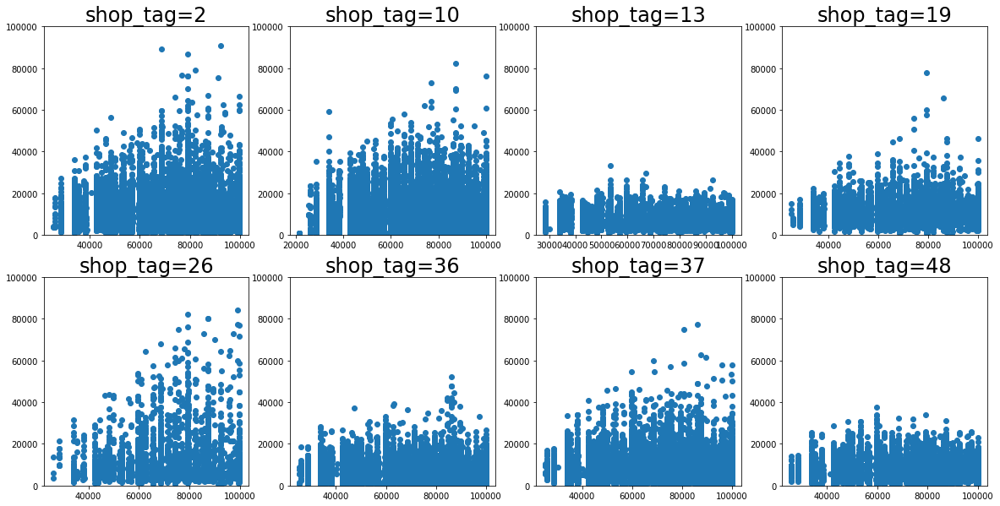

In [ ]:
fig, axs = plt.subplots(2, 4,figsize=(20,10))
axs[0, 0].scatter(data_s_pred[(data_s_pred['shop_tag']=='2') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='2') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[0, 0].set_title('shop_tag=2', size=24)
axs[0, 0].set_ylim([0, 10**5])
axs[0, 1].scatter(data_s_pred[(data_s_pred['shop_tag']=='10') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='10') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[0, 1].set_title('shop_tag=10', size=24)
axs[0, 1].set_ylim([0, 10**5])
axs[0, 2].scatter(data_s_pred[(data_s_pred['shop_tag']=='13') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='13') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[0, 2].set_title('shop_tag=13', size=24)
axs[0, 2].set_ylim([0, 10**5])
axs[0, 3].scatter(data_s_pred[(data_s_pred['shop_tag']=='19') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='19') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[0, 3].set_title('shop_tag=19', size=24)
axs[0, 3].set_ylim([0, 10**5])

axs[1, 0].scatter(data_s_pred[(data_s_pred['shop_tag']=='26') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='26') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[1, 0].set_title('shop_tag=26', size=24)
axs[1, 0].set_ylim([0, 10**5])
axs[1, 1].scatter(data_s_pred[(data_s_pred['shop_tag']=='36') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='36') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[1, 1].set_title('shop_tag=36', size=24)
axs[1, 1].set_ylim([0, 10**5])
axs[1, 2].scatter(data_s_pred[(data_s_pred['shop_tag']=='37') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='37') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[1, 2].set_title('shop_tag=37', size=24)
axs[1, 2].set_ylim([0, 10**5])
axs[1, 3].scatter(data_s_pred[(data_s_pred['shop_tag']=='48') & (data_s_pred['slam']<10**5)]['slam'], data_s_pred[(data_s_pred['shop_tag']=='48') & (data_s_pred['slam']<10**5)]['txn_amt'])
axs[1, 3].set_title('shop_tag=48', size=24)
axs[1, 3].set_ylim([0, 10**5])

plt.show()

# 關聯分析

In [ ]:
# 用全部的算關聯分析
data = pd.read_csv('/content/drive/Shareddrives/統學期末比賽/Sample/sample_for_asssociation_12.csv')

In [ ]:
data_basket = data.groupby(['chid', 'dt','shop_tag'])['txn_cnt'].sum().unstack().reset_index().fillna(0).set_index(['chid', 'dt'])

In [ ]:
data_basket

shop_tag       1   10   11   12   13   14  ...    5    6    7    8    9  other
chid     dt                                ...                                
10000000 12  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0
         13  0.0  2.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    1.0
         14  0.0  4.0  0.0  2.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    1.0
         15  0.0  3.0  0.0  1.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    1.0
         16  0.0  2.0  0.0  2.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    1.0
...          ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...    ...
10499999 18  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0
         19  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0
         20  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0
         22  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0
         23  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  0.0  0.0  0.0  0.0    0.0

[5248026 rows x 49 columns]

In [ ]:
def hot_encode(x):
    if(x<= 0):
        return 0
    if(x>= 1):
        return 1

In [ ]:
basket_encoded = data_basket.applymap(hot_encode)
data_basket = basket_encoded

In [ ]:
data_basket

shop_tag     1  10  11  12  13  14  15  16  ...  47  48  5  6  7  8  9  other
chid     dt                                 ...                              
10000000 13  0   1   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      1
         14  0   1   0   1   0   0   0   0  ...   0   0  0  0  0  0  0      1
         15  0   1   0   1   0   0   0   0  ...   0   0  0  0  0  0  0      1
         16  0   1   0   1   0   0   0   0  ...   0   0  0  0  0  0  0      1
         17  0   1   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0
...         ..  ..  ..  ..  ..  ..  ..  ..  ...  ..  .. .. .. .. .. ..    ...
10499999 18  0   0   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0
         19  0   0   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0
         20  0   0   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0
         22  0   0   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0
         23  0   0   0   0   0   0   0   0  ...   0   0  0  0  0  0  0      0

[4877240 rows x 49 columns]

In [ ]:
# Building the model
frq_items = apriori(data_basket, min_support = 0.000, use_colnames = True, max_len = 2)
 
# Collecting the inferred rules in a dataframe
rules = association_rules(frq_items, metric ="lift")
rules = rules.sort_values(['confidence', 'lift'], ascending =[False, False])

In [ ]:
pred

[2, 6, 10, 12, 13, 15, 18, 19, 21, 22, 25, 26, 36, 37, 39, 48]

* antecedents: If component (Y)
* consequents: Then component (X)
* **support**: frequency (number(X⋂Y)/number(AllSamples))
* **confidence**:　P(X|Y), conditional probability 
* **lift**: P(Y|X)/P(Y), X發生下，同時發生Y的可能性，且只看Y發生的機率，提升度反應了X與Y的關聯性，lift>1表示越正相關，lift=1表示為獨立，lift<1代表越負相關
* leverage: P(A⋂B)-P(A)P(B), difference of X and Y appearing together in the data set and what would be expected if X and Y where statistically dependent.
* conviction: P(A)P(B)/P(A⋂B), the probability that X appears without Y if they were dependent with the actual frequency of the appearance of X without Y

In [ ]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
  display(rules)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1562,(29),(other),0.000010,0.344371,8.384105e-06,0.880000,2.555381,5.103144e-06,5.463572
403,(14),(15),0.008782,0.301077,5.556565e-03,0.632738,2.101579,2.912571e-03,1.903063
565,(7),(15),0.012920,0.301077,8.087422e-03,0.625984,2.079148,4.197645e-03,1.868699
546,(42),(15),0.010062,0.301077,6.295129e-03,0.625618,2.077930,3.265610e-03,1.866869
1067,(21),(37),0.058537,0.462268,3.661929e-02,0.625575,1.353274,9.559512e-03,1.436154
2166,(44),(other),0.004596,0.344371,2.806960e-03,0.610713,1.773413,1.224159e-03,1.684177
556,(47),(15),0.025367,0.301077,1.548011e-02,0.610254,2.026899,7.842772e-03,1.793275
1615,(3),(other),0.012350,0.344371,7.495580e-03,0.606931,1.762431,3.242602e-03,1.667972
451,(14),(37),0.008782,0.462268,5.329242e-03,0.606852,1.312773,1.269711e-03,1.367762
2124,(42),(other),0.010062,0.344371,6.102485e-03,0.606473,1.761101,2.637331e-03,1.666031


In [ ]:
rules.shape

(2208, 9)

In [ ]:
rules.to_csv("/content/drive/Shareddrives/統學期末比賽/EDA_files/association_rules_12.csv", index = False)

In [ ]:
rules = pd.read_csv("/content/drive/Shareddrives/統學期末比賽/EDA_files/association_rules_12.csv")

In [ ]:
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,29,other,0.000010,0.344371,0.000008,0.880000,2.555381,0.000005,5.463572
1,14,15,0.008782,0.301077,0.005557,0.632738,2.101579,0.002913,1.903063
2,7,15,0.012920,0.301077,0.008087,0.625984,2.079148,0.004198,1.868699
3,42,15,0.010062,0.301077,0.006295,0.625618,2.077930,0.003266,1.866869
4,21,37,0.058537,0.462268,0.036619,0.625575,1.353274,0.009560,1.436154
5,44,other,0.004596,0.344371,0.002807,0.610713,1.773413,0.001224,1.684177
6,47,15,0.025367,0.301077,0.015480,0.610254,2.026899,0.007843,1.793275
7,3,other,0.012350,0.344371,0.007496,0.606931,1.762431,0.003243,1.667972
8,14,37,0.008782,0.462268,0.005329,0.606852,1.312773,0.001270,1.367762
9,42,other,0.010062,0.344371,0.006102,0.606473,1.761101,0.002637,1.666031


In [ ]:
rules['antecedents'] = rules['antecedents'].str.replace('frozenset\(\{\'', '')
rules['antecedents'] = rules['antecedents'].str.replace('\'\}\)', '')
rules['consequents'] = rules['consequents'].str.replace('frozenset\(\{\'', '')
rules['consequents'] = rules['consequents'].str.replace('\'\}\)', '')

In [ ]:
rules.to_csv("/content/drive/Shareddrives/統學期末比賽/EDA_files/association_rules_12.csv", index = False)

# 變數整理

In [ ]:
data.head(10)

,Unnamed: 0,dt,chid,shop_tag,txn_cnt,txn_amt,domestic_offline_cnt,domestic_online_cnt,overseas_offline_cnt,overseas_online_cnt,domestic_offline_amt_pct,domestic_online_amt_pct,overseas_offline_amt_pct,overseas_online_amt_pct,card_1_txn_cnt,card_2_txn_cnt,card_3_txn_cnt,card_4_txn_cnt,card_5_txn_cnt,card_6_txn_cnt,card_7_txn_cnt,card_8_txn_cnt,card_9_txn_cnt,card_10_txn_cnt,card_11_txn_cnt,card_12_txn_cnt,card_13_txn_cnt,card_14_txn_cnt,card_other_txn_cnt,card_1_txn_amt_pct,card_2_txn_amt_pct,card_3_txn_amt_pct,card_4_txn_amt_pct,card_5_txn_amt_pct,card_6_txn_amt_pct,card_7_txn_amt_pct,card_8_txn_amt_pct,card_9_txn_amt_pct,card_10_txn_amt_pct,card_11_txn_amt_pct,card_12_txn_amt_pct,card_13_txn_amt_pct,card_14_txn_amt_pct,card_other_txn_amt_pct,masts,educd,trdtp,naty,poscd,cuorg,slam,gender_code,age,primary_card
0,36,13,10048145,5,1,4684.483372,0,0,0,1,0.0,0.00,0.0,1.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,1.622014e+07,0.0,2.0,0
1,41,13,10048145,36,1,5773.036485,1,0,0,0,1.0,0.00,0.0,0.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,1.622014e+07,0.0,2.0,0
2,43,13,10048145,45,1,2262.383305,1,0,0,0,1.0,0.00,0.0,0.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,1.622014e+07,0.0,2.0,0
3,87,13,10256467,12,1,2397.282233,0,1,0,0,0.0,1.00,0.0,0.00,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,2.0,1.0,1.0,30.0,9.598282e+04,0.0,5.0,1
4,163,13,10027466,12,3,14508.928266,0,3,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1
5,172,13,10027466,13,11,11824.704068,0,9,0,2,0.0,0.85,0.0,0.15,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1
6,181,13,10027466,14,1,4458.891790,0,1,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1
7,190,13,10027466,15,0,4458.891790,0,0,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1
8,200,13,10027466,19,1,8271.840706,0,1,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1
9,204,13,10027466,other,4,7129.627255,0,3,0,1,0.0,0.44,0.0,0.56,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,6.912998e+04,1.0,3.0,1


In [ ]:
# 丟掉slam、primary_card
df = data.drop(['slam', 'primary_card'], axis=1)

# 合併txn_cnt, 只留1,2,4,6
others = [16,18] + [x for x in range(20,29)]
df['card_others_txn_cnt'] = df.iloc[:,others].sum(axis=1)
df.drop(df.columns[others], axis=1, inplace = True)

# 合併txn_amt_pct
others = [20,22] + [x for x in range(24,33)]
df['card_others_txn_amt_pct'] = df.iloc[:,others].sum(axis=1)
df.drop(df.columns[others], axis=1, inplace = True)

# 拿掉第一行
df.drop(df.columns[0], axis=1, inplace=True)

In [ ]:
df.head(10)

,dt,chid,shop_tag,txn_cnt,txn_amt,domestic_offline_cnt,domestic_online_cnt,overseas_offline_cnt,overseas_online_cnt,domestic_offline_amt_pct,domestic_online_amt_pct,overseas_offline_amt_pct,overseas_online_amt_pct,card_1_txn_cnt,card_2_txn_cnt,card_4_txn_cnt,card_6_txn_cnt,card_1_txn_amt_pct,card_2_txn_amt_pct,card_4_txn_amt_pct,card_6_txn_amt_pct,masts,educd,trdtp,naty,poscd,cuorg,age,card_others_txn_cnt,card_others_txn_amt_pct
0,13,10048145,5,1,4684.483372,0,0,0,1,0.0,0.00,0.0,1.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,2.0,1,1.0
1,13,10048145,36,1,5773.036485,1,0,0,0,1.0,0.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,2.0,1,1.0
2,13,10048145,45,1,2262.383305,1,0,0,0,1.0,0.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,5.0,15.0,1.0,99.0,30.0,2.0,1,1.0
3,13,10256467,12,1,2397.282233,0,1,0,0,0.0,1.00,0.0,0.00,0,0,1,0,0.0,0.0,1.0,0.0,2.0,4.0,2.0,1.0,1.0,30.0,5.0,0,0.0
4,13,10027466,12,3,14508.928266,0,3,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,3,1.0
5,13,10027466,13,11,11824.704068,0,9,0,2,0.0,0.85,0.0,0.15,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,11,1.0
6,13,10027466,14,1,4458.891790,0,1,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,1,1.0
7,13,10027466,15,0,4458.891790,0,0,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,0,1.0
8,13,10027466,19,1,8271.840706,0,1,0,0,0.0,1.00,0.0,0.00,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,1,1.0
9,13,10027466,other,4,7129.627255,0,3,0,1,0.0,0.44,0.0,0.56,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,12.0,1.0,3.0,30.0,3.0,4,1.0
